In [3]:
from lsst.daf.butler import Butler, Timespan
from lsst.afw.fits import makeLimitedFitsHeader
import lsst.sphgeom as sphgeom
import lsst.geom as geom
import lsst.afw.display as afwDisplay
from astropy.time import Time
from astropy.wcs import WCS
from astropy.table import Table, Column, vstack
from astropy.coordinates import SkyCoord
from astropy.io import fits


import json
import pandas as pd
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline

# HST Data

In [2]:
# wget https://archive.stsci.edu/hlsps/candels/goods-s/catalogs/v1/hlsp_candels_hst_wfc3_goodss-tot-multiband_f160w_v1_cat.fits
hst_cat = fits.open('/global/homes/y/yaswante/hlsp_candels_hst_wfc3_goodss-tot-multiband_f160w_v1_cat.fits')

In [3]:
print(hst_cat.info())
print("Here is the cards in PrimaryHDU Header:\n")
print(hst_cat[0].header.cards)
print("\nHere is the cards in BinTableHDU Header:\n")
print(hst_cat[1].header.cards)
print("\nHere are the columns in detection BinTableHDU Header:\n")
print(hst_cat[1].columns)

Filename: /global/homes/y/yaswante/hlsp_candels_hst_wfc3_goodss-tot-multiband_f160w_v1_cat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   (23962,)   uint8   
  1  CANDELS.GOODSS.F160W.v1_tostil.cat    1 BinTableHDU    930   34930R x 459C   [J, 37A, D, D, E, I, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, I, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, D, D, D, D, E, E, D, D, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E,

In [3]:
hst_df = Table.read(hst_cat, hdu=1).to_pandas()

In [5]:
hst_df

,ID,IAU_Name,RA,DEC,F160W_LIMITING_MAGNITUDE,FLAGS,CLASS_STAR,CTIO_U_FLUX,CTIO_U_FLUXERR,VIMOS_U_FLUX,...,FWHM_IMAGE_F606W,FWHM_IMAGE_F775W,FWHM_IMAGE_F814W,FWHM_IMAGE_F850LP,FWHM_IMAGE_F098M,FWHM_IMAGE_F105W,FWHM_IMAGE_F125W,FWHM_IMAGE_F160W,KRON_RADIUS,PETRO_RADIUS
0,1,CANDELS_GDS_F160W_J033222.31-275716.3,53.092996,-27.954538,27.850000,0,0.03,0.905690,0.027562,0.880580,...,10.09,8.52,8.89,8.230000,-99.00,-99.0,6.72,6.46,3.50,4.62
1,2,CANDELS_GDS_F160W_J033224.69-275734.7,53.102888,-27.959662,26.340000,0,0.51,0.262016,0.015454,0.154036,...,0.00,-99.00,0.00,0.000000,-99.00,-99.0,3.78,3.78,8.49,4.62
2,3,CANDELS_GDS_F160W_J033224.40-275730.5,53.101686,-27.958479,27.040001,0,0.03,0.618902,0.017016,0.630785,...,19.41,-99.00,17.67,18.139999,-99.00,-99.0,15.01,15.85,4.34,5.28
3,4,CANDELS_GDS_F160W_J033224.54-275731.1,53.102280,-27.958651,27.030001,0,0.01,0.047186,0.015292,0.031425,...,0.00,-99.00,9.68,0.000000,-99.00,-99.0,9.84,9.84,8.00,10.56
4,5,CANDELS_GDS_F160W_J033221.73-275730.5,53.090559,-27.958499,27.629999,0,0.00,0.041068,0.015775,0.039770,...,13.90,0.00,0.00,0.000000,-99.00,-99.0,13.90,13.90,3.50,5.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34925,34926,CANDELS_GDS_F160W_J033242.12-274029.6,53.175520,-27.674899,28.340000,0,0.50,-0.006706,0.015911,0.009228,...,4.47,-99.00,-99.00,7.400000,7.40,-99.0,4.00,4.60,5.61,6.60
34926,34927,CANDELS_GDS_F160W_J033232.46-274047.6,53.135252,-27.679915,28.320000,0,0.00,0.034277,0.017014,0.011318,...,10.78,12.18,12.18,9.410000,10.78,-99.0,9.59,12.18,5.63,7.92
34927,34928,CANDELS_GDS_F160W_J033233.92-274109.5,53.141342,-27.685999,28.480000,0,0.00,-0.021608,0.015855,-0.000453,...,10.13,10.13,8.24,0.000000,10.13,-99.0,10.13,10.13,7.41,10.56
34928,34929,CANDELS_GDS_F160W_J033232.92-274053.9,53.137204,-27.681651,28.350000,0,0.85,0.011592,0.015179,0.005212,...,5.67,5.36,6.98,0.000000,0.00,-99.0,5.81,4.21,3.50,7.26


Following the tech note, we first apply a `FLAGS == 0` cut that only keeps the non-contaminated sources regarding the F160W detection band.

In [4]:
hst_df = hst_df[hst_df['FLAGS'] == 0].copy()
hst_df

,ID,IAU_Name,RA,DEC,F160W_LIMITING_MAGNITUDE,FLAGS,CLASS_STAR,CTIO_U_FLUX,CTIO_U_FLUXERR,VIMOS_U_FLUX,...,FWHM_IMAGE_F606W,FWHM_IMAGE_F775W,FWHM_IMAGE_F814W,FWHM_IMAGE_F850LP,FWHM_IMAGE_F098M,FWHM_IMAGE_F105W,FWHM_IMAGE_F125W,FWHM_IMAGE_F160W,KRON_RADIUS,PETRO_RADIUS
0,1,CANDELS_GDS_F160W_J033222.31-275716.3,53.092996,-27.954538,27.850000,0,0.03,0.905690,0.027562,0.880580,...,10.09,8.52,8.89,8.230000,-99.00,-99.0,6.72,6.46,3.50,4.62
1,2,CANDELS_GDS_F160W_J033224.69-275734.7,53.102888,-27.959662,26.340000,0,0.51,0.262016,0.015454,0.154036,...,0.00,-99.00,0.00,0.000000,-99.00,-99.0,3.78,3.78,8.49,4.62
2,3,CANDELS_GDS_F160W_J033224.40-275730.5,53.101686,-27.958479,27.040001,0,0.03,0.618902,0.017016,0.630785,...,19.41,-99.00,17.67,18.139999,-99.00,-99.0,15.01,15.85,4.34,5.28
3,4,CANDELS_GDS_F160W_J033224.54-275731.1,53.102280,-27.958651,27.030001,0,0.01,0.047186,0.015292,0.031425,...,0.00,-99.00,9.68,0.000000,-99.00,-99.0,9.84,9.84,8.00,10.56
4,5,CANDELS_GDS_F160W_J033221.73-275730.5,53.090559,-27.958499,27.629999,0,0.00,0.041068,0.015775,0.039770,...,13.90,0.00,0.00,0.000000,-99.00,-99.0,13.90,13.90,3.50,5.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34925,34926,CANDELS_GDS_F160W_J033242.12-274029.6,53.175520,-27.674899,28.340000,0,0.50,-0.006706,0.015911,0.009228,...,4.47,-99.00,-99.00,7.400000,7.40,-99.0,4.00,4.60,5.61,6.60
34926,34927,CANDELS_GDS_F160W_J033232.46-274047.6,53.135252,-27.679915,28.320000,0,0.00,0.034277,0.017014,0.011318,...,10.78,12.18,12.18,9.410000,10.78,-99.0,9.59,12.18,5.63,7.92
34927,34928,CANDELS_GDS_F160W_J033233.92-274109.5,53.141342,-27.685999,28.480000,0,0.00,-0.021608,0.015855,-0.000453,...,10.13,10.13,8.24,0.000000,10.13,-99.0,10.13,10.13,7.41,10.56
34928,34929,CANDELS_GDS_F160W_J033232.92-274053.9,53.137204,-27.681651,28.350000,0,0.85,0.011592,0.015179,0.005212,...,5.67,5.36,6.98,0.000000,0.00,-99.0,5.81,4.21,3.50,7.26


We get rid of 318 objects (34930 - 34612). We also place a magnitude cut on the HST catalog `(mag_F814W < 26.5)`. We'll use the `FLUX_BEST_F814W (uJy)` column as it provides us the "best" estimate of the total flux of an object, which is what we'll want to use for calculating the total magnitude. From https://irsa.ipac.caltech.edu/data/COSMOS/images/candels/hlsp_candels_hst_cos-tot_readme_v1.0.pdf, we have the zeropoint to be 25.947 for F814W (nJy). Since the flux is in uJy, we obtain a converted zeropoint of `23.9` (https://dawn-cph.github.io/dja/blog/2023/07/14/photometric-catalog-demo/). 

In [5]:
# cut out rows where FLUX < 0
valid_flux = hst_df['FLUX_BEST_F814W'] > 0

In [6]:
candels_zp = 23.9 # zeropoint (uJy)
hst_df['mag_F814W'] = -2.5 * np.log10(hst_df['FLUX_BEST_F814W']) + candels_zp

/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [9]:
hst_df['mag_F814W'].describe()

count    33029.000000
mean        26.252785
std          1.755461
min         15.890005
25%         25.313347
50%         26.437344
75%         27.376719
max         37.006142
Name: mag_F814W, dtype: float64

In [21]:
hst_dcut = hst_df.copy()

In [10]:
mag_s = 26.5
hst_dcut = hst_df[hst_df['mag_F814W'] < mag_s].copy()

In [11]:
hst_dcut['mag_F814W'].describe()

count    17049.000000
mean        24.984989
std          1.364149
min         15.890005
25%         24.386538
50%         25.365963
75%         25.994463
max         26.499992
Name: mag_F814W, dtype: float64

We got rid of ~15k (33029 - 17049) objects that had a valid flux > 0! Let's take a look at the distribution of the magnitudes.

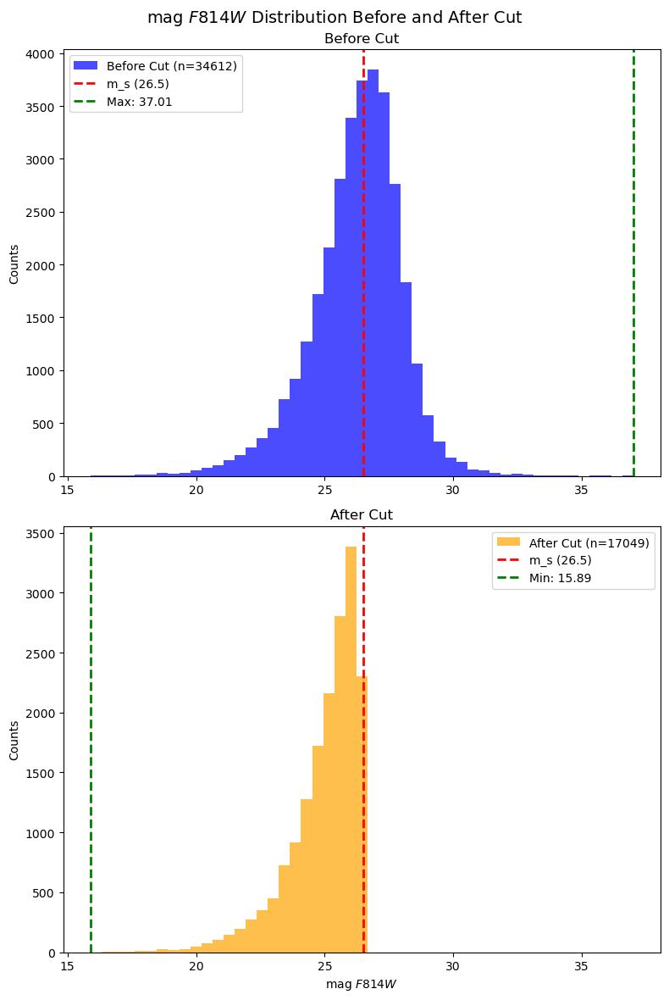

In [12]:
bins = np.linspace(hst_df['mag_F814W'].min(), hst_df['mag_F814W'].max(), 50)
fig, axs = plt.subplots(2, 1, figsize=(8, 12))
fig.suptitle('mag $F814W$ Distribution Before and After Cut', fontsize=14)
# before cut
axs[0].hist(hst_df['mag_F814W'], bins=bins, color='blue', alpha=0.7, 
           label=f'Before Cut (n={len(hst_df)})')
axs[0].axvline(26.5, color='red', linestyle='--', linewidth=2, label='m_s (26.5)')
axs[0].axvline(hst_df['mag_F814W'].max(), color='green', linestyle='--', 
              linewidth=2, label=f'Max: {hst_df["mag_F814W"].max():.2f}')
axs[0].set_ylabel('Counts')
axs[0].set_title('Before Cut')
axs[0].legend(frameon=True)
# after cut
axs[1].hist(hst_dcut['mag_F814W'], bins=bins, color='orange', alpha=0.7, 
           label=f'After Cut (n={len(hst_dcut)})')
axs[1].axvline(26.5, color='red', linestyle='--', linewidth=2, label='m_s (26.5)')
axs[1].axvline(hst_dcut['mag_F814W'].min(), color='green', linestyle='--', 
              linewidth=2, label=f'Min: {hst_dcut["mag_F814W"].min():.2f}')
axs[1].set_xlabel('mag $F814W$')
axs[1].set_ylabel('Counts')
axs[1].set_title('After Cut')
axs[1].legend(frameon=True)

plt.tight_layout()

# DP1 Data

## Butler Setup

In [1]:
import os
os.environ['DAF_BUTLER_REPOSITORY_INDEX'] = '/global/cfs/cdirs/lsst/production/gen3/shared/data-repos.yaml'

In [4]:
# DAF_BUTLER_REPOSITORY_INDEX='/global/cfs/cdirs/lsst/production/gen3/shared/data-repos.yaml'
# LOCATION OF DP1 DATA: '/global/cfs/cdirs/lsst/production/gen3/rubin/DP1/repo'
import os
os.environ['DAF_BUTLER_REPOSITORY_INDEX'] = '/global/cfs/cdirs/lsst/production/gen3/shared/data-repos.yaml'
repo = "/repo/DP1"
collection = "LSSTComCam/DP1"
butler = Butler(repo, collections=collection)
assert butler is not None

In [5]:
skymap = butler.get("skyMap", skymap="lsst_cells_v1")

In [10]:
# from exploring the butler repo tutorial 
all_tracts = butler.query_dimension_records('tract')
all_tract_ids = []
for tract in all_tracts:
    all_tract_ids.append(tract.id)
print('Number of DP1 tracts: ', len(all_tract_ids))
print(all_tract_ids)

Number of DP1 tracts:  31
[453, 454, 531, 532, 2234, 2235, 2393, 2394, 4016, 4017, 4217, 4218, 4848, 4849, 5062, 5063, 5064, 5305, 5306, 5525, 5526, 7610, 7611, 7849, 7850, 10221, 10222, 10463, 10464, 10704, 10705]


Let's focus on the tracts that overlap with the HST. From a plot on https://dp1.lsst.io/tutorials/notebook/301/notebook-301-4.html and https://dp1.lsst.io/tutorials/notebook/104/notebook-104-2.html, we have the tracts 5062, 5063, 4849, 4848 and 5064 that seem to overlap with the data. So, let's grab all the detections from all of these tracts using Butler and the `object` dataset.

## Grabbing Source Catalogs that Overlap with HST

In [12]:
tracts = (5062, 5063, 4849, 4848, 5064)
query = f"tract IN {tracts}"          # :tracts is a named bind variable
dataset_refs = butler.query_datasets(
    "object",
    where=query,
    # bind={"tracts": tracts}
)
print(len(dataset_refs))

5


In [13]:
flux_bands = ['u_cModelFlux', 'u_cModelFluxErr', 
              'g_cModelFlux', 'g_cModelFluxErr', 
              'r_cModelFlux', 'r_cModelFluxErr', 
              'i_cModelFlux', 'i_cModelFluxErr',
              'z_cModelFlux', 'z_cModelFluxErr',
              'y_cModelFlux', 'y_cModelFluxErr']

butler_cols = ['coord_ra', 'coord_dec', 'refExtendedness', 'tract',
               'objectId', 'parentObjectId', 'shape_xx', 'shape_xy', 'shape_yy',
               'refBand', 'x', 'y', 'patch', 'i_blendedness', 'deblend_failed', 'deblend_skipped',
               'deblend_nChild', 'detect_fromBlend', 'detect_isIsolated', 'detect_isDeblendedModelSource'] + flux_bands

all_sources = []
all_spherepoints = []
for cats in dataset_refs:
    sources = butler.get(cats, parameters={'columns': butler_cols})
    all_sources.append(sources)
    all_spherepoints.append((cats.dataId['tract'], skymap[cats.dataId['tract']].getCtrCoord()))
    print(len(sources), f"in tract {cats.dataId['tract']}: {skymap[cats.dataId['tract']].getCtrCoord()}")

62720 in tract 4848: (52.1495327103, -29.0082644628)
96145 in tract 4849: (53.8317757009, -29.0082644628)
0 in tract 5062: (51.4285714286, -27.5206611570)
335955 in tract 5063: (53.0875576037, -27.5206611570)
31 in tract 5064: (54.7465437788, -27.5206611570)


In [14]:
main_table = vstack(all_sources, metadata_conflicts='silent')
# primary_table = primary_table[np.isin(primary_table['patch'], patch_ids)]
print(len(main_table), len(np.unique(main_table['objectId'])))

494851 494851


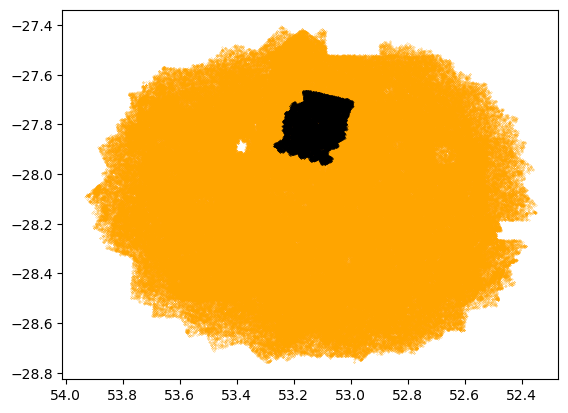

In [240]:
plt.scatter(main_table['coord_ra'], main_table['coord_dec'], s=0.03, c=['orange'], label='DP1 Detections')
plt.scatter(hst_dcut['RA'], hst_dcut['DEC'], s=0.05, label='HST Detections', c=['black'])
plt.gca().invert_xaxis()

/tmp/ipykernel_807849/3957064919.py:35: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


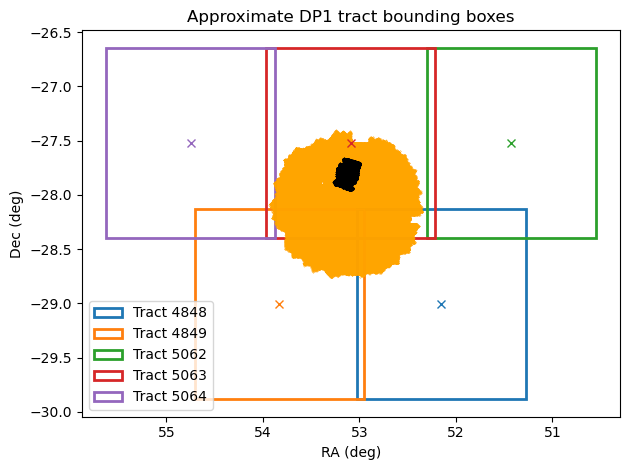

In [239]:
from matplotlib.patches import Polygon
half_width = 0.875        # deg  (1/2 of 1.75°)
col_cycle  = plt.rcParams["axes.prop_cycle"].by_key()["color"]

fig, ax = plt.subplots()

for i, (tid, sp) in enumerate(all_spherepoints):
    # four corners: (RA−Δ,Dec−Δ) → (RA+Δ,Dec+Δ) counter-clockwise
    ra_c = sp.getRa().asDegrees()
    dec_c = sp.getDec().asDegrees()
    corners = np.array([
        [ra_c - half_width, dec_c - half_width],
        [ra_c - half_width, dec_c + half_width],
        [ra_c + half_width, dec_c + half_width],
        [ra_c + half_width, dec_c - half_width]
    ])

    patch = Polygon(corners, closed=True, fill=False,
                    edgecolor=col_cycle[i % len(col_cycle)],
                    linewidth=2, label=f"Tract {tid}")
    ax.add_patch(patch)

    # optional: mark centre
    ax.plot(ra_c, dec_c, "x", color=patch.get_edgecolor())

ax.set_xlabel("RA (deg)")
ax.set_ylabel("Dec (deg)")
ax.invert_xaxis()
ax.set_title("Approximate DP1 tract bounding boxes")
ax.legend()

plt.scatter(main_table['coord_ra'], main_table['coord_dec'], s=0.03, c=['orange'], label='DP1 Detections')
plt.scatter(hst_dcut['RA'], hst_dcut['DEC'], s=0.05, label='HST Detections', c=['black'])

plt.tight_layout()

Looks like, for us, we primarily have overlap in just tract 5063. So, let's focus on just that data.

In [15]:
overlap_tract = main_table[main_table['tract'] == 5063].to_pandas()
patch_ids = [24, 25, 34, 35, 44, 45] # from tech note
overlap_patch = overlap_tract[np.isin(overlap_tract['patch'], patch_ids)].copy()

In [19]:
overlap_patch

,coord_ra,coord_dec,refExtendedness,tract,objectId,parentObjectId,shape_xx,shape_xy,shape_yy,refBand,...,g_cModelFlux,g_cModelFluxErr,r_cModelFlux,r_cModelFluxErr,i_cModelFlux,i_cModelFluxErr,z_cModelFlux,z_cModelFluxErr,y_cModelFlux,y_cModelFluxErr
155749,53.138193,-28.020065,0.0,5063,611255072642302217,0,5.041179,5.956017,30.064754,i,...,74.070450,8.980067,94.390976,12.148847,118.268440,19.437592,190.748444,40.127754,-338.059784,272.000366
155750,53.249697,-28.019883,1.0,5063,611255072642302221,0,4.701024,0.310753,3.835722,i,...,62.263889,9.097219,105.695953,11.394966,223.352036,19.570524,184.258041,41.523666,3.726336,266.569855
155751,53.251226,-28.019377,1.0,5063,611255072642302228,0,8.530828,-1.918834,9.108959,g,...,190.972916,10.262106,202.092041,13.256878,203.334503,23.140408,205.319550,48.362793,113.029701,308.203918
155752,53.240813,-28.018766,1.0,5063,611255072642302243,0,3.037798,-0.187474,7.345825,i,...,15.282253,8.998789,86.416771,11.111383,175.927109,19.223228,190.851425,40.600616,628.733521,265.193359
155753,53.194395,-28.018496,1.0,5063,611255072642302252,0,9.706776,-0.400444,6.185992,g,...,126.956398,11.541379,120.575455,12.423060,141.998276,21.199800,106.838341,50.989780,-298.184631,293.352020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319355,53.012071,-27.521696,NaN,5063,611256515751338772,611256515751319928,NaN,NaN,NaN,u,...,-86.397491,56.341137,278.923859,131.645630,68.742020,126.312576,-72.845093,230.333725,NaN,NaN
319356,53.012402,-27.521117,1.0,5063,611256515751338773,611256515751319928,33.614090,12.530488,42.899982,u,...,32.603661,51.211777,159.200439,123.188461,24.300835,114.543541,26.437822,208.694397,NaN,NaN
319357,53.012579,-27.522350,0.0,5063,611256515751338774,611256515751319928,NaN,NaN,NaN,u,...,-5.131617,40.603745,-22.416399,96.185165,63.252804,83.098969,94.331367,167.091507,NaN,NaN
319358,53.009192,-27.520920,0.0,5063,611256515751338784,611256515751319938,NaN,NaN,NaN,u,...,41.774540,40.927036,18.096371,96.052948,57.913239,85.689705,456.914642,174.421005,NaN,NaN


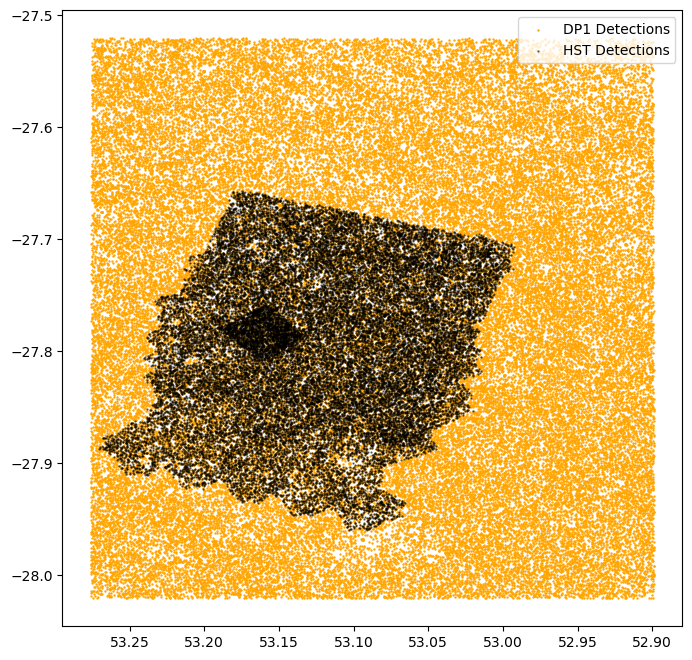

In [22]:
plt.figure(figsize=(8, 8))
plt.scatter(overlap_patch['coord_ra'], overlap_patch['coord_dec'], s=0.5, c=['orange'], label='DP1 Detections')
plt.gca().invert_xaxis()
plt.scatter(hst_dcut['RA'], hst_dcut['DEC'], s=0.5, alpha=0.5, label='HST Detections', c=['black'])
plt.legend()

In [23]:
ra_min, ra_max, dec_min, dec_max = hst_dcut['RA'].min(), hst_dcut['RA'].max(), hst_dcut['DEC'].min(), hst_dcut['DEC'].max()
corners = np.array(
    [(ra_min, dec_min), # bottom left
     (ra_max, dec_min), # bottom right
     (ra_min, dec_max), # top left
     (ra_max, dec_max) # top right
    ]
)
# ras, decs = corners[:, 0], corners[:, 1]
mask = (
    (overlap_patch['coord_ra'] >= ra_min) & (overlap_patch['coord_ra'] <= ra_max) &
    (overlap_patch['coord_dec'] >= dec_min) & (overlap_patch['coord_dec'] <= dec_max)
)
overlap_cut = overlap_patch[mask].copy()

In [24]:
overlap_cut

,coord_ra,coord_dec,refExtendedness,tract,objectId,parentObjectId,shape_xx,shape_xy,shape_yy,refBand,...,g_cModelFlux,g_cModelFluxErr,r_cModelFlux,r_cModelFluxErr,i_cModelFlux,i_cModelFluxErr,z_cModelFlux,z_cModelFluxErr,y_cModelFlux,y_cModelFluxErr
155948,53.183962,-27.959588,1.0,5063,611255072642303692,0,5.836056,1.095178,8.136501,i,...,53.272408,12.029434,262.677643,15.725054,477.353271,24.249891,457.090240,50.032120,917.335754,368.334473
155950,53.257128,-27.958691,0.0,5063,611255072642303711,0,2.292909,0.642947,2.691425,i,...,-28.891153,9.658196,33.117889,11.479823,115.097275,19.663013,96.333916,41.882496,-559.569519,259.515289
155951,53.159761,-27.958443,1.0,5063,611255072642303714,0,NaN,NaN,NaN,i,...,50.451466,10.035091,46.525375,12.143414,132.721893,20.491793,156.685272,42.553604,406.188873,305.638733
155952,53.182790,-27.958455,0.0,5063,611255072642303718,0,2.837168,-0.362043,3.437238,i,...,66.962547,9.116186,94.017746,11.555410,128.618271,19.075020,86.642921,41.471508,331.875977,286.641388
155953,53.258177,-27.958199,1.0,5063,611255072642303726,0,10.106479,-4.722257,7.670470,g,...,94.164299,10.095402,80.827950,12.023028,104.269135,20.913029,108.341125,44.204887,-84.283730,272.460083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319246,53.007832,-27.665694,NaN,5063,611256515751338218,611256515751319442,94.980049,-13.148056,7.183660,u,...,59.425339,23.062117,-59.474247,35.216648,-14.225564,32.963604,-1.055863,109.372963,723.123230,482.460083
319247,53.008274,-27.664825,0.0,5063,611256515751338219,611256515751319442,NaN,NaN,NaN,u,...,11.529197,16.175831,-25.451859,24.415737,-3.086797,33.740314,55.042252,73.910957,1238.469727,492.025085
319248,53.008665,-27.666106,1.0,5063,611256515751338220,611256515751319442,83.881821,-41.556915,42.628899,u,...,28.925180,19.633053,-16.216492,24.059111,0.000000,NaN,-272.111481,101.387093,58.530884,487.112030
319251,52.995440,-27.660678,1.0,5063,611256515751338233,611256515751319454,NaN,NaN,NaN,u,...,16.889051,17.265142,4.297997,25.583450,-12.749956,35.675358,-74.710609,77.900627,157.018127,546.049377


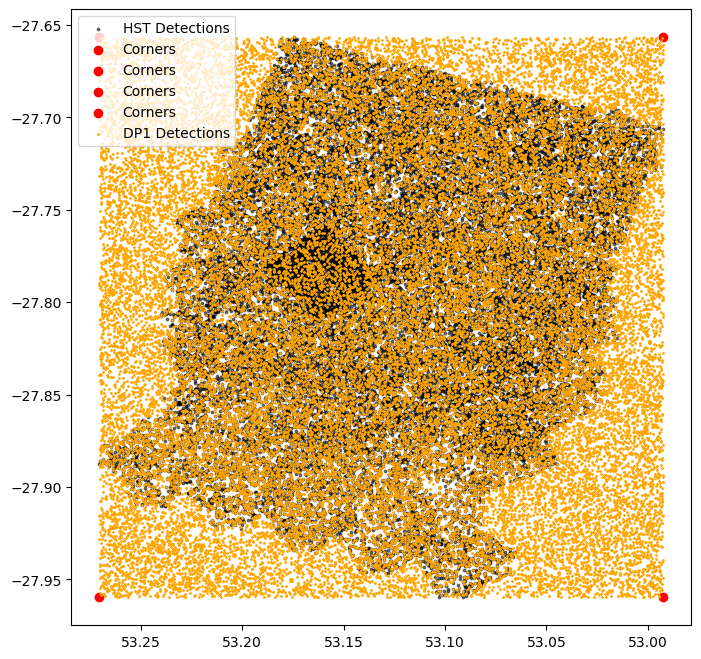

In [25]:
plt.figure(figsize=(8, 8))
plt.scatter(hst_dcut['RA'], hst_dcut['DEC'], s=3, alpha=0.5, label='HST Detections', c=['black'])
for corner in corners:
    plt.scatter(corner[0], corner[1], c=['red'], label='Corners')
plt.scatter(overlap_cut['coord_ra'], overlap_cut['coord_dec'], s=1, c=['orange'], label='DP1 Detections')
plt.gca().invert_xaxis()
plt.legend()

## Adding magnitudes to catalog

In [26]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
for b in bands:
    flux_col = f'{b}_cModelFlux'
    mag_col = f'mag_{b}'
    overlap_cut.loc[:, mag_col] = -2.5 * np.log10(overlap_cut[flux_col]) + 31.4

/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: Runtime

In [27]:
overlap_cut.columns

Index(['coord_ra', 'coord_dec', 'refExtendedness', 'tract', 'objectId',
       'parentObjectId', 'shape_xx', 'shape_xy', 'shape_yy', 'refBand', 'x',
       'y', 'patch', 'i_blendedness', 'deblend_failed', 'deblend_skipped',
       'deblend_nChild', 'detect_fromBlend', 'detect_isIsolated',
       'detect_isDeblendedModelSource', 'u_cModelFlux', 'u_cModelFluxErr',
       'g_cModelFlux', 'g_cModelFluxErr', 'r_cModelFlux', 'r_cModelFluxErr',
       'i_cModelFlux', 'i_cModelFluxErr', 'z_cModelFlux', 'z_cModelFluxErr',
       'y_cModelFlux', 'y_cModelFluxErr', 'mag_u', 'mag_g', 'mag_r', 'mag_i',
       'mag_z', 'mag_y'],
      dtype='object')

In [104]:
# overlap_cut.to_json('/global/homes/y/yaswante/lsst_dets_hst.json', orient='records')
hst_df.to_json('/global/homes/y/yaswante/hst_dets_lsst.json', orient='records')

## Grabbing Coadds that Overlap with HST

In [16]:
# dataId = {"band": "r", "skymap": "lsst_cells_v1", "tract": 5063, "patch": 14} # 3442, 20
# deep_coadd = butler.get("deep_coadd", dataId=dataId)
bands = ['u', 'g', 'r', 'i', 'z', 'y']
dataId_base = {"skymap": "lsst_cells_v1", "tract": 5063}

coadd_dict = {}
for band in bands:
    coadd_dict[band] = {}
    for patch_id in patch_ids:
        dataId = dict(dataId_base, band=band, patch=patch_id)
        coadd_dict[band][patch_id] = butler.get("deep_coadd", dataId=dataId)
# ~90 seconds for a single tract 6 bands and 6 patches

In [44]:
coadd_dict

{'u': {24: <lsst.afw.image._exposure.ExposureF at 0x7fb675a2acf0>,
  25: <lsst.afw.image._exposure.ExposureF at 0x7fb66d1ce230>,
  34: <lsst.afw.image._exposure.ExposureF at 0x7fb664a21030>,
  35: <lsst.afw.image._exposure.ExposureF at 0x7fb65c3ecc70>,
  44: <lsst.afw.image._exposure.ExposureF at 0x7fb65c439df0>,
  45: <lsst.afw.image._exposure.ExposureF at 0x7fb653f7f670>},
 'g': {24: <lsst.afw.image._exposure.ExposureF at 0x7fb683fbfbb0>,
  25: <lsst.afw.image._exposure.ExposureF at 0x7fb63453aef0>,
  34: <lsst.afw.image._exposure.ExposureF at 0x7fb629acabf0>,
  35: <lsst.afw.image._exposure.ExposureF at 0x7fb61f7800b0>,
  44: <lsst.afw.image._exposure.ExposureF at 0x7fb6170afeb0>,
  45: <lsst.afw.image._exposure.ExposureF at 0x7fb616bba630>},
 'r': {24: <lsst.afw.image._exposure.ExposureF at 0x7fb600c91cf0>,
  25: <lsst.afw.image._exposure.ExposureF at 0x7fb5f45f63f0>,
  34: <lsst.afw.image._exposure.ExposureF at 0x7fb5eae8fa30>,
  35: <lsst.afw.image._exposure.ExposureF at 0x7fb5df

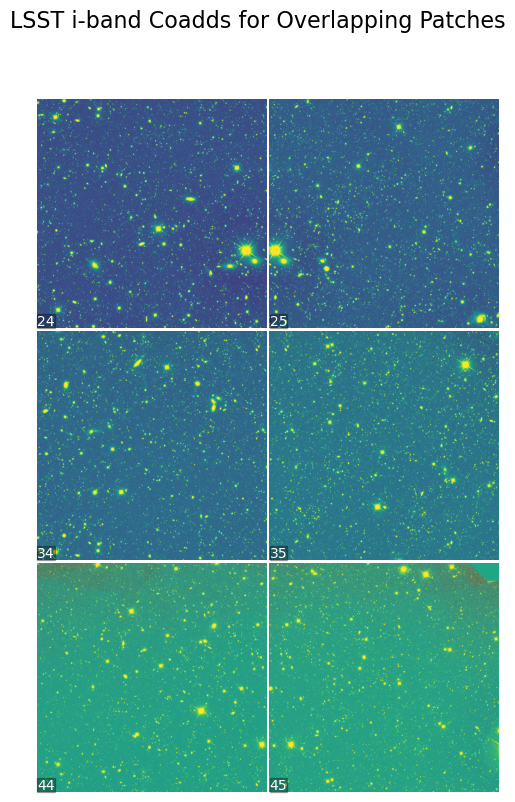

In [64]:
fig, axes = plt.subplots(3, 2, figsize=(8, 9), sharex=True, sharey=True, gridspec_kw={'wspace': -0.4, 'hspace': 0.01})
fig.suptitle('LSST i-band Coadds for Overlapping Patches', fontsize=16)

for idx, patch_id in enumerate(patch_ids):
    row, col = divmod(idx, 2)
    ax = axes[row, col]
    lsst_iband_img = coadd_dict[bands[3]][patch_id].image.array
    ax.imshow(lsst_iband_img, norm=asinh_norm(lsst_iband_img, a=0.1), origin='lower', cmap='viridis')
    ax.text(5, 5, f'{patch_id}', color='white', fontsize=10,
        ha='left', va='bottom', bbox=dict(facecolor='black', alpha=0.3, pad=0.01))
    ax.axis('off')

# plt.tight_layout()

## Grabbing Catalog for Coadd

We will set mag limit cut at $i = 24.5$ because the HST F814W catalog is only complete to $m_{F814W} = 26.5$. This means it contains all true sources at magnitudes brighter than 26.5, but may miss fainter ones. From the tech note ["Unrecognized Blends in LSSTComCam Data Preview 1 ECDFS"](https://sitcomtn-128.lsst.io/#magdist), they state:
  > “Even though the LSSTComCam $i$-mag distribution peaks at 25, we are only able to confidently label blends up to $m_g = 24.5$ because the HST catalog is complete only up to $m_{F814W} = 26.5$...”

So, fainter sources risk missing genuine counterparts or blends due to the incompleteness of the HST catalog, leading to unreliable metrics.

In [44]:
def get_cat(patch_id, exp, overlap_cut, mag_lim=24.5): 
    print(exp.getPhotoCalib().instFluxToMagnitude(1.0)) # 31.4
    height, width = exp.image.array.shape
    wcs = WCS(exp.getWcs().getFitsMetadata())
    wcs_header = makeLimitedFitsHeader(exp.getWcs().getFitsMetadata())
    subimage_origin = exp.getXY0()
    origin = (subimage_origin.getX(), subimage_origin.getY())
    # print(origin)
    
    patch_mask = overlap_cut['patch'] == patch_id
    detect_isPrimary_mask = overlap_cut['deblend_nChild'] == 0
    # mag_i_mask = ~overlap_cut['mag_i'].isna() & np.isfinite(overlap_cut['mag_i'])
    # dcut = overlap_cut[patch_mask & mag_i_mask].copy()
    dcut_mag_lim = overlap_cut[patch_mask & detect_isPrimary_mask].copy()
    # dcut_mag_lim = dcut[dcut['mag_i'] <= mag_lim].copy() # 24.5 from tech note
    
    ra_all = dcut_mag_lim['coord_ra'].values
    dec_all = dcut_mag_lim['coord_dec'].values
    sky_coords = SkyCoord(ra=ra_all*u.degree, dec=dec_all*u.degree)
   
    xs, ys = wcs.world_to_pixel(sky_coords)
    xs -= origin[0]
    ys -= origin[1]
    inds = np.where((xs>0) & (xs<width-1) & (ys>0) & (ys<height-1))[0]
    final_cat = dcut_mag_lim.iloc[inds].copy()
    final_cat.loc[:, 'cutout_x'] = xs[inds]
    final_cat.loc[:, 'cutout_y'] = ys[inds]

    # let's reset the origin so that our WCS works correctly
    exp.setXY0(geom.PointI(0, 0))
    wcs_header = makeLimitedFitsHeader(exp.getWcs().getFitsMetadata()) 
    return final_cat, wcs_header

In [45]:
patch_id = 25
exp = coadd_dict[bands[3]][patch_id]
final_cat, wcs_header = get_cat(patch_id, exp, overlap_cut)
print("After filtering: we have ", len(final_cat), " objects.")

31.4
After filtering: we have  3785  objects.


In [42]:
from astropy.visualization import AsinhStretch, MinMaxInterval, ImageNormalize
import matplotlib.pyplot as plt
def asinh_norm(data, a=0.1):
    finite_data = data[np.isfinite(data)] # ensure no NaN or inf vals
    if len(finite_data) == 0:
        return ImageNormalize(vmin=0, vmax=1, stretch=AsinhStretch(a=a))
    # percentile-based limits
    vmin, vmax = np.percentile(finite_data, [1, 99])
    return ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch(a=a))

Text(0.5, 1.0, 'Patch 25 - 3785 objects')

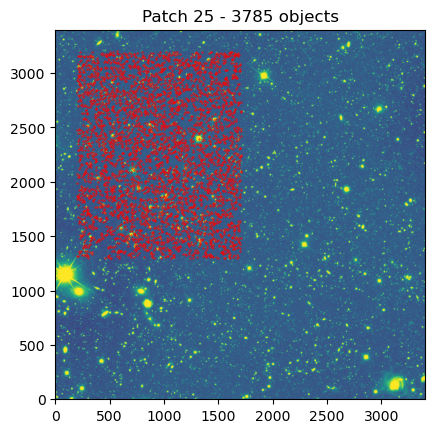

In [30]:
# fig, ax = plt.subplots(1)
lsst_iband_img = exp.image.array
plt.imshow(lsst_iband_img, norm=asinh_norm(lsst_iband_img, a=0.1), origin='lower', cmap='viridis')
plt.scatter(final_cat['cutout_x'], final_cat['cutout_y'], marker='x', color='red', alpha=0.5, s=1, label='DP1 Dets')
plt.title(f'Patch {patch_id} - {len(final_cat)} objects')

### Visualizing Catalogs for All Coadds

Loading data for Patch 24...
Loading data for Patch 25...
Loading data for Patch 34...
Loading data for Patch 35...
Loading data for Patch 44...
Loading data for Patch 45...


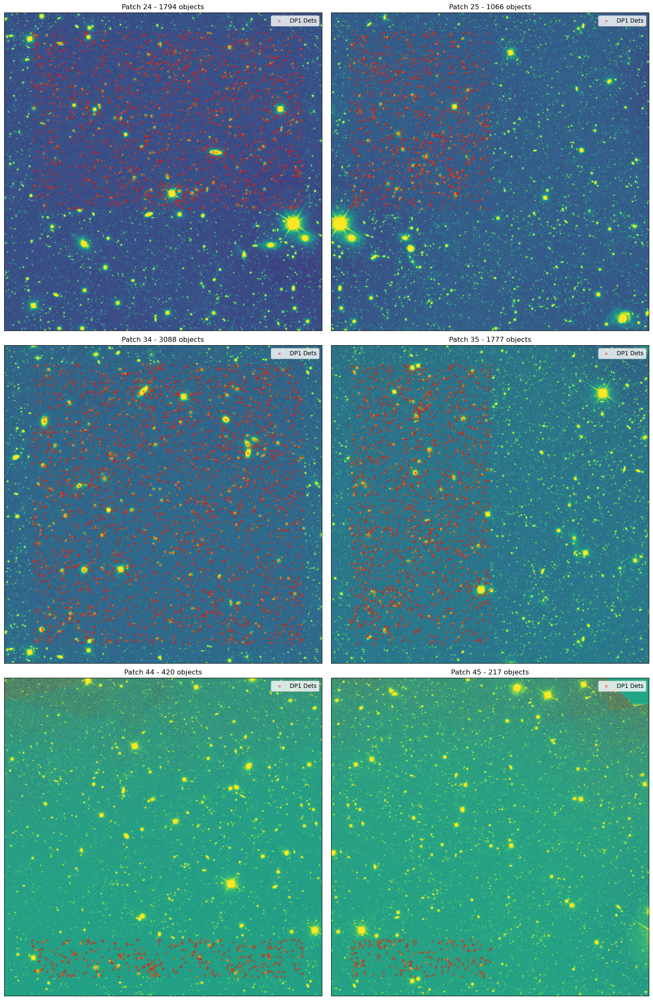

In [54]:
fig, axs = plt.subplots(3, 2, figsize=(16, 24))
axs = axs.ravel()
for i, patch_id in enumerate(patch_ids):
    ax = axs[i]
    exp = coadd_dict[bands[3]][patch_id]
    lsst_iband_img = exp.image.array
    print(f"Loading data for Patch {patch_id}...")
    final_cat, _ = get_cat(patch_id, exp, overlap_cut)
    ax.imshow(lsst_iband_img, norm=asinh_norm(lsst_iband_img, a=0.1), origin='lower', cmap='viridis')
    ax.scatter(final_cat['cutout_x'], final_cat['cutout_y'], marker='x', color='red', alpha=0.5, s=10, label='DP1 Dets')
    ax.set_title(f'Patch {patch_id} - {len(final_cat)} objects')
    ax.legend(loc='upper right')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()

## Saving WCS, Cutouts with all 6 bands and Catalogs for Each Patch

In [64]:
coadd_dict[bands[3]][patch_ids[0]].image.array.shape

(3400, 3400)

In [43]:
all_wcs = {}
for i, patch_id in enumerate(patch_ids):
    # lsst = np.stack([coadd_dict[band][patch_id].image.array for band in bands])
    # np.save(f'/global/homes/y/yaswante/full_p{patch_id}.npy', lsst)
    
    print(f"Loading data for Patch {patch_id}...")
    exp = coadd_dict[bands[3]][patch_id]
    full_cat = pd.read_json('/global/homes/y/yaswante/lsst_dets_hst.json', orient='records')
    final_cat, wcs_header = get_cat(patch_id, exp, full_cat, 30)
    all_wcs[patch_id] = wcs_header

    print(f"Saving {len(final_cat)} objects for Patch {patch_id}")
    # final_cat.to_json(f'/global/homes/y/yaswante/full_p{patch_id}.json', orient='records')

with open('/global/homes/y/yaswante/wcs_dp1.json', 'w') as f:
    json.dump(all_wcs, f, indent=4)

Loading data for Patch 24...
Saving 7135 objects for Patch 24
Loading data for Patch 25...
Saving 3772 objects for Patch 25
Loading data for Patch 34...
Saving 11063 objects for Patch 34
Loading data for Patch 35...
Saving 5969 objects for Patch 35
Loading data for Patch 44...
Saving 1313 objects for Patch 44
Loading data for Patch 45...
Saving 748 objects for Patch 45


With 24.5 mag cut:
```
Loading data for Patch 24...
Saving 1794 objects for Patch 24
Loading data for Patch 25...
Saving 1066 objects for Patch 25
Loading data for Patch 34...
Saving 3088 objects for Patch 34
Loading data for Patch 35...
Saving 1777 objects for Patch 35
Loading data for Patch 44...
Saving 420 objects for Patch 44
Loading data for Patch 45...
Saving 217 objects for Patch 45
```
Random mag cuts
```
Loading data for Patch 24...
Saving 7333 objects for Patch 24
Loading data for Patch 25...
Saving 3973 objects for Patch 25
Loading data for Patch 34...
Saving 11650 objects for Patch 34
Loading data for Patch 35...
Saving 6251 objects for Patch 35
Loading data for Patch 44...
Saving 1412 objects for Patch 44
Loading data for Patch 45...
Saving 774 objects for Patch 45
```

# Exploring DP1 Data Products

In [14]:
wcs = WCS(deep_coadd.getWcs().getFitsMetadata())
subimage_origin = deep_coadd.getXY0()
origin = (subimage_origin.getX(), subimage_origin.getY())

tables = ['object', 'source', 'object_forced_source',
          'dia_object', 'dia_source', 'dia_object_forced_source',
          'ss_object', 'ss_source',
          'visit_table', 'visit_detector_table']

for table in tables:
    print('')
    print(table)
    print(butler.get_dataset_type(table))
    print('required: ', butler.get_dataset_type(table).dimensions.required)


object
DatasetType('object', {skymap, tract}, ArrowAstropy)
required:  {skymap, tract}

source
DatasetType('source', {band, instrument, day_obs, physical_filter, visit}, ArrowAstropy)
required:  {instrument, visit}

object_forced_source
DatasetType('object_forced_source', {skymap, tract, patch}, ArrowAstropy)
required:  {skymap, tract, patch}

dia_object
DatasetType('dia_object', {skymap, tract}, ArrowAstropy)
required:  {skymap, tract}

dia_source
DatasetType('dia_source', {skymap, tract}, ArrowAstropy)
required:  {skymap, tract}

dia_object_forced_source
DatasetType('dia_object_forced_source', {skymap, tract, patch}, ArrowAstropy)
required:  {skymap, tract, patch}

ss_object
DatasetType('ss_object', {}, ArrowAstropy)
required:  {}

ss_source
DatasetType('ss_source', {}, ArrowAstropy)
required:  {}

visit_table
DatasetType('visit_table', {instrument}, ArrowAstropy)
required:  {instrument}

visit_detector_table
DatasetType('visit_detector_table', {instrument}, ArrowAstropy)
required: 

In [15]:
dataset_type = butler.get_dataset_type('object')
for dimension in dataset_type.dimensions.data_coordinate_keys:
    print('dimension = ', dimension)
    print(butler.dimensions[dimension].schema)
    print(' ')

dimension =  skymap
skymap: 
  name: string
  hash: hash
    A hash of the skymap's parameters.
  tract_max: int
    Maximum ID for tracts in this skymap, exclusive.
  patch_nx_max: int
    Number of patches in the x direction in each tract.
  patch_ny_max: int
    Number of patches in the y direction in each tract.
 
dimension =  tract
tract: 
  skymap: string
  id: int
  region: region
 


In [16]:
query = f"tract = {5063}"
print(query)
dataset_refs = butler.query_datasets("object",
                                     where=query)
print(len(dataset_refs))
# del query, dataset_refs

tract = 5063
1


In [17]:
column_names = ['tract', 'patch', 'coord_ra', 'coord_dec', 'r_cModelFlux']
sources = butler.get(dataset_refs[0],
                     parameters={'columns': column_names})
print(len(sources))

335955


In [18]:
img_sources = sources[sources['patch'] == 14].to_pandas()

In [19]:
ra_all = img_sources['coord_ra'].values
dec_all = img_sources['coord_dec'].values
sky_coords = SkyCoord(ra=ra_all*u.degree, dec=dec_all*u.degree)

xs, ys = wcs.world_to_pixel(sky_coords)
xs -= origin[0]
ys -= origin[1]
inds = np.where((xs>0) & (xs<3400-1) & (ys>0) & (ys<3400-1))[0]
dcut = img_sources.iloc[inds]
dcut.loc[:, 'cutout_x'] = xs[inds]
dcut.loc[:, 'cutout_y'] = ys[inds]
dcut.loc[:, 'mag_r'] = -2.5 * np.log10(dcut['r_cModelFlux']) + 31.4
print("After filtering: we have ", len(dcut), " objects.")

After filtering: we have  11123  objects.


/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [20]:
dcut

,tract,patch,coord_ra,coord_dec,r_cModelFlux,cutout_x,cutout_y,mag_r
0,5063,14,53.226482,-28.186980,1178.476196,994.763762,203.466269,23.721699
1,5063,14,53.202159,-28.186654,116.546989,1380.666429,209.729317,26.233746
2,5063,14,53.187899,-28.186399,383.528809,1606.933478,214.512849,24.940506
3,5063,14,53.108281,-28.186149,338.051910,2870.188650,219.660778,25.077541
4,5063,14,53.128316,-28.185761,245.192978,2552.293359,226.547899,25.426229
...,...,...,...,...,...,...,...,...
11118,5063,14,53.199957,-28.166476,3.458846,1415.275727,573.010941,30.052671
11119,5063,14,53.241310,-28.075780,0.000000,757.000000,2205.000000,inf
11120,5063,14,53.240763,-28.076375,-25.860813,765.700494,2194.298685,NaN
11121,5063,14,53.108581,-28.042086,-12.262217,2864.990398,2813.070851,NaN


In [21]:
dcut = dcut[~dcut['mag_r'].isna() & np.isfinite(dcut['mag_r'])]

In [23]:
dcut_mag_lim = dcut[dcut['mag_r'] < 27.5]
dcut_mag_lim

,tract,patch,coord_ra,coord_dec,r_cModelFlux,cutout_x,cutout_y,mag_r
0,5063,14,53.226482,-28.186980,1178.476196,994.763762,203.466269,23.721699
1,5063,14,53.202159,-28.186654,116.546989,1380.666429,209.729317,26.233746
2,5063,14,53.187899,-28.186399,383.528809,1606.933478,214.512849,24.940506
3,5063,14,53.108281,-28.186149,338.051910,2870.188650,219.660778,25.077541
4,5063,14,53.128316,-28.185761,245.192978,2552.293359,226.547899,25.426229
...,...,...,...,...,...,...,...,...
11105,5063,14,53.126186,-28.084209,49.621208,2585.529556,2054.706223,27.160831
11106,5063,14,53.132444,-28.082249,51.484962,2486.128233,2089.971003,27.120798
11110,5063,14,53.088301,-28.062185,89.641090,3187.190629,2451.288861,26.518732
11111,5063,14,53.087812,-28.062615,64.381950,3194.965277,2443.535325,26.878090


In [37]:
insane_mag_obj = dcut.iloc[dcut['mag_r'].argmax()]

In [39]:
insane_mag_obj['mag_r']

np.float64(84.83111572265625)

(2255.782963569216, 2355.782963569216)

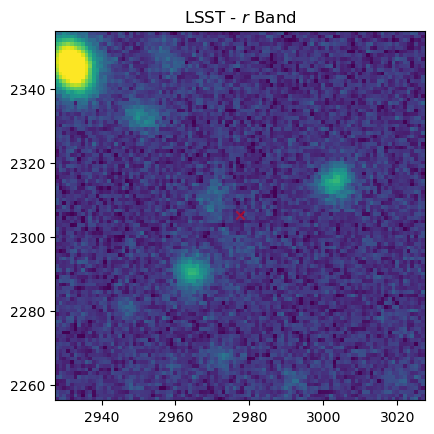

In [48]:
fig, ax = plt.subplots(1)
lsst_rband_img = deep_coadd.image.array
ax.imshow(lsst_rband_img, norm=asinh_norm(lsst_rband_img, a=0.1), origin='lower', cmap='viridis')
ax.set_title(r'LSST - $r$ Band')
# if dcut is not None:
#     print("\nPlotting objects from catalog:")
# ax.scatter(dcut['cutout_x'], dcut['cutout_y'], marker='+', color=['green'], alpha=0.5, s=1)
# ax.scatter(dcut_mag_lim['cutout_x'], dcut_mag_lim['cutout_y'], marker='x', color=['red'], alpha=0.5)
# ax.scatter(insane_mag_obj['cutout_x'], insane_mag_obj['cutout_y'], marker='x', color=['red'], alpha=0.5)
# ax.set_xlim(insane_mag_obj['cutout_x'] - 50, insane_mag_obj['cutout_x'] + 50)
# ax.set_ylim(insane_mag_obj['cutout_y'] - 50, insane_mag_obj['cutout_y'] + 50)